<a href="https://colab.research.google.com/github/lehairem/LearnRoadSign/blob/main/LearnRoadSign_Carvalho_Lehaire.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Apprentissage supervisé pour classification multi-classe, appliqué aux données réelles

=> Appliqué à la classification des panneaux de signalisation routière

Pour le réaliser, il faut passer par les étapes suivantes

**1 Lire les données** (images + labels) de la base de données

**2 Préparer les données** (taille, format, normalisation) pour l'apprentissage

**3 Construire (définir) l'architecture du réseau** (couches, nombre de neurons, fonctions d'activations, ...)

**4 Réaliser l'apprentissage , évaluer les performances**  (accuracy, loss etc..), changer les paramètres, modèle ou autre pour obtenir les résultat souhaité

**5 Faire un test** sur quelques images que le réseau n'a jamais vu



__________________________________________________________________
### 🔼 Avant de commencer à exécuter les blocks de code, connectez-vous à un environnement d'éxecution GPU ou TPU

(Menu à côté RAM/Disk => modifier le type d'exécution => TPU ou GPU)

_____________________________________________________________

#👆Etape 1


1.1 Faire import de toutes les librairies nécessaires (on peut en ajouter au fur et à mésure mais n'oubliez pas réxécuter le block en cas de modifications)
---
1.1 Import all necessary libraries (we can add more as we go, but don't forget to re-execute the block in case of modifications)

In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import datetime
import pandas as pd # Added for reading CSV
from glob import glob # Added for listing files easily

!pip install opencv-python
import cv2 as cv2

from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, accuracy_score,confusion_matrix,classification_report

# Load the TensorBoard notebook extension (cela nous permettra de visualiser de manière pratique les données d'historique d'apprentissage )
!pip install tensorboard
%load_ext tensorboard
!pip install tensorflow
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical # convert to one-hot-encoding
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from keras import layers
from tensorflow import keras
from tensorflow.keras.layers import Rescaling
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, Activation

# New imports for image preprocessing
!pip install scikit-image
from skimage import exposure

print (tf.__version__)

2.20.0


_______________________________________________________________
1.2. **Les fichiers .zip des données** que l'on va utiliser **doivent être téléchargés dans votre espace DRIVE esans passer par le PC local, cela va vous faire gagner du temps**

**Pour cela, commencez par vous connectez votre drive à Colab Notebook pour pouvoir y accéder 👈**


In [ ]:
# Code(import + mount)
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


👉 Suivez les étapes suivantes

Commencez par importer manuellement le fichier zip dans votre drive, puis à l'aide des commandes proposées vous pouvez extraire le dataset :

1.   extraire le dataset importé sur le drive sous forme de fichier compressé .zip
2.   définir une variable qui contiendra le chemin vers le dataset
3.   vérifer la présence des données



⚠(adaptez les lignes ci-dessous à votre cas)


In [ ]:
# Modifiez les chemins des fichiers et des dossiers pour correspondre à l'organisation de votre Drive
ds_file_zip = "/content/drive/Shareddrives/Introduction IA/archive.zip" # complétez le chemin vers votre fichier zip contenant les données du dataset

# !unzip file_to_decompress -d folder_to_decompress_data_into
#!unzip "/content/drive/Shareddrives/Introduction IA/archive.zip" -d  "/content/drive/Shareddrives/Introduction IA/dataset/" # pour extraire vos données, complétez les chemins d'entrée et de sortie

path_ds = "/content/drive/Shareddrives/Introduction IA/dataset/" # spécifiez où se trouvera le répertoire de votre dataset

print(os.listdir(path_ds))
print( os.listdir(os.path.join(path_ds,'train')))

['train']
['26', '34', '23', '21', '31', '32', '22', '16', '19', '33', '30', '28', '27', '20', '29', '24', '37', '40', '42', '39', '41', '36', '6', '2', '38', '35', '17', '3', '4', '5', '7', '8', '9', '18', '25', '0', '1', '10', '11', '12', '13', '14', '15']


__________________________________________________________________

# 👆 Etape 2


2.1. Maintenant, on vas préparer les données pour l'utilisation pour l'entrainement et on en profite pour regarder quelques images dans le dataset. Les étapes sont les suivantes


1.   Lire les images dans les dossiers du répértoire dataset (0,1,2..), ces sont les classes à reconnaitre

2.   Réunir dans deux np.array distincts
    - les images redimensionnées à 30x30
    - les numéros des labels correspondants à chaque image

**Questions**
- combien d'images contient le dataset (au total, par classe);
- les classes - sont-elle équilibrées ?
Pour le rapport, ajoutez un graphique de distribution des classes.
(paut-être fait avec un tableur)




In [66]:
# Initialisation des listes pour stocker les images et les labels
data = [] # Cette liste contiendra les images traitées
labels = [] # Cette liste contiendra les labels (numéros de classe) correspondants

# Définition du nombre de classes (par exemple, 43 classes pour les panneaux de signalisation)
classes = 43 # Nombre total de classes de panneaux de signalisation
n_learned_classes = classes # On utilise toutes les classes disponibles pour l'apprentissage

# --- DEBUT DE LA PARTIE À COMPLETER PAR L'ÉLÈVE ---

# Instructions : Parcourez chaque dossier de classe dans le répertoire 'train'.
# Pour chaque image dans chaque dossier :
# 1. Chargez l'image.
# 2. Redimensionnez l'image à 30x30 pixels
# 3. Convertissez l'image redimensionnée en un tableau NumPy.
# 4. Ajoutez l'image au tableau `data`.
# 5. Ajoutez le label (numéro de la classe actuelle) au tableau `labels`.
# Gérez les erreurs de chargement d'image si nécessaire.

# Vous pouvez vous inspirer du code suivant, mais vous devrez le compléter !
for i in range(n_learned_classes):
    # TODO: Construire le chemin vers le dossier de la classe actuelle
    # 'path_ds' est défini dans la cellule précédente (Etape 1.2)
    path = os.path.join(path_ds, 'train', str(i))
    # TODO: Lister tous les fichiers images dans ce dossier
    images = os.listdir(path)

    print(f'Classe : {i}, Nombre d\'images : {len(images)}') # Afficher le nombre d'images par classe

    for a in images:
        try:
            # TODO: Chargez l'image 'a' depuis le 'path' actuel (utiliser Image.open)
            img = Image.open(path + '/' + a)
            # TODO: Redimensionnez l'image à (30,30) (utiliser image.resize)
            img = img.resize((30, 30))
            # TODO: Convertissez l'image en tableau NumPy (utiliser np.array)
            img = np.array(img)
            img = exposure.equalize_adapthist(img, clip_limit=0.03) # ajouter en séance 2
            # TODO: Ajoutez l'image au tableau 'data' (utiliser data.append)
            data.append(img)
            # TODO: Ajoutez le label 'i' au tableau 'labels' (utiliser labels.append)
            labels.append(i)
        except Exception as e:
            # Gérer les erreurs de chargement d'image (par exemple, fichiers corrompus)
            print(f"Erreur de chargement de l'image {a} dans la classe {i}: {e}")

# --- FIN DE LA PARTIE À COMPLETER PAR L'ÉLÈVE ---

# Conversion des listes en tableaux NumPy pour l'utilisation avec TensorFlow/Keras
data = np.array(data)
labels = np.array(labels)

# Affichage des dimensions des tableaux créés pour vérification
print("Taille totale des données (nombre d'éléments) :", data.size)
print("Forme des données (nombre d'images, hauteur, largeur, canaux) :", data.shape)
print("Taille totale des labels (nombre d'éléments) :", labels.size)
print("Forme des labels (nombre de labels) :", labels.shape)


Classe : 0, Nombre d'images : 210
Classe : 1, Nombre d'images : 66
Classe : 2, Nombre d'images : 453
Classe : 3, Nombre d'images : 644
Classe : 4, Nombre d'images : 809
Classe : 5, Nombre d'images : 868
Classe : 6, Nombre d'images : 420
Classe : 7, Nombre d'images : 638
Classe : 8, Nombre d'images : 622
Classe : 9, Nombre d'images : 690
Classe : 10, Nombre d'images : 833
Classe : 11, Nombre d'images : 605
Classe : 12, Nombre d'images : 503
Classe : 13, Nombre d'images : 560
Classe : 14, Nombre d'images : 780
Classe : 15, Nombre d'images : 630
Classe : 16, Nombre d'images : 420
Classe : 17, Nombre d'images : 916
Classe : 18, Nombre d'images : 522
Classe : 19, Nombre d'images : 210
Classe : 20, Nombre d'images : 360
Classe : 21, Nombre d'images : 330
Classe : 22, Nombre d'images : 390
Classe : 23, Nombre d'images : 510
Classe : 24, Nombre d'images : 270
Classe : 25, Nombre d'images : 688
Classe : 26, Nombre d'images : 600
Classe : 27, Nombre d'images : 240
Classe : 28, Nombre d'images : 

Le dataset contient 21 355 images réparties en 43 classes.
Après préparation les données ont la forme (21355, 30, 30, 3) ce qui signifie que chaque image a été redimensionnée en 30 × 30 pixels avec 3 canaux de couleur.

On répartie alors chaque nombre d'image dans une liste pour en fournir un graphique.

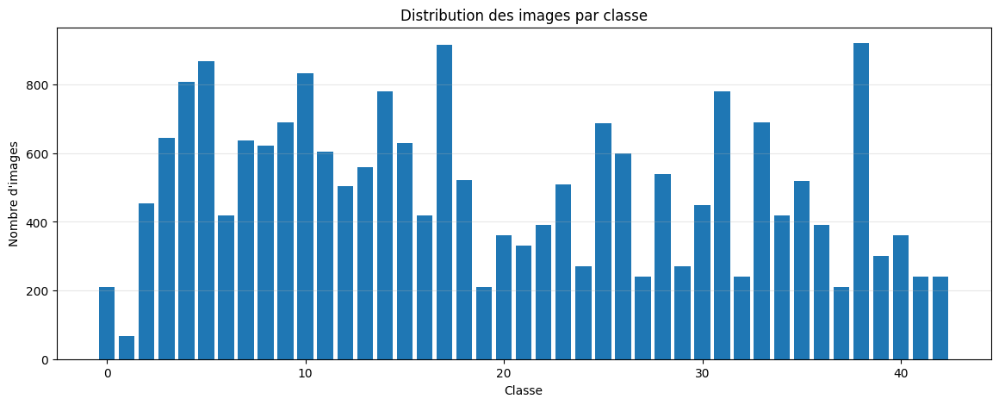

In [ ]:
nb_img = [210, 66, 453, 644, 809, 868, 420, 638, 622, 690,
                        833, 605, 503, 560, 780, 630, 420, 916, 522, 210,
                        360, 330, 390, 510, 270, 688, 600, 240, 540, 270,
                        450, 780, 240, 689, 420, 518, 390, 210, 921, 300,
                        360, 240, 240]

plt.figure(figsize=(14,5))
plt.bar(range(43), nb_img )
plt.xlabel("Classe")
plt.ylabel("Nombre d'images")
plt.title("Distribution des images par classe")
plt.grid(axis='y', alpha=0.3)
plt.show()

Le graphique de distribution des classes montre que le dataset est déséquilibré. Certaines classes possèdent beaucoup plus d’images que d’autres. Par exemple la classe 1 ne contient que 66 images tandis que la classe 38 en contient 921.

2.2. On prend connaissance de nos données - à quoi cela ressemble .... visualisez quelques images de votre dataset --

*   Quelle est la qualité d'images ?
*   Les panneaux, ont-il toujours la même position, la même forme ?
*   Quelles conséquences pour apprentissage ?

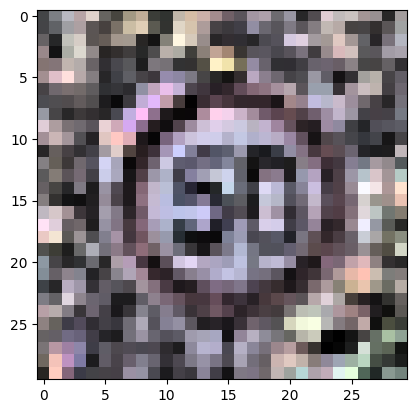

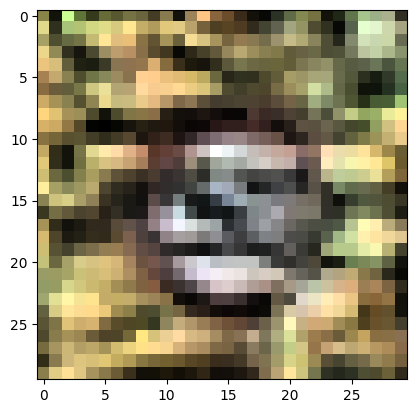

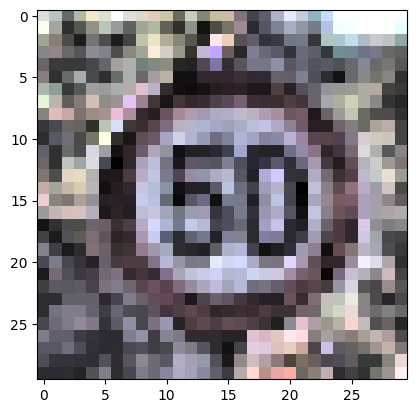

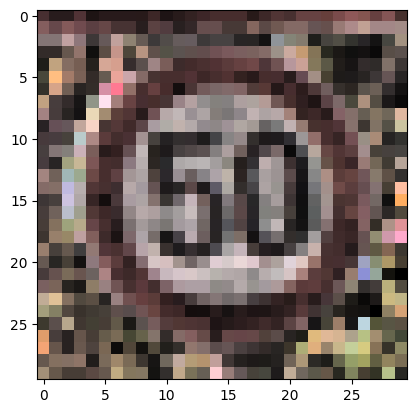

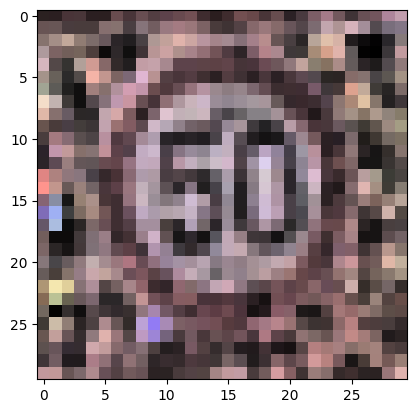

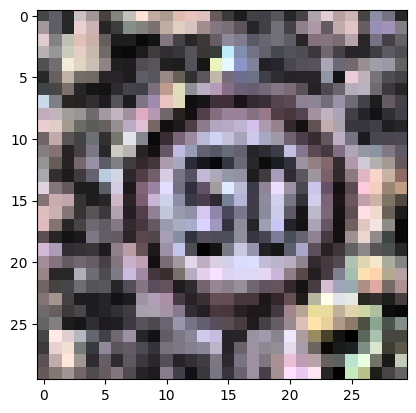

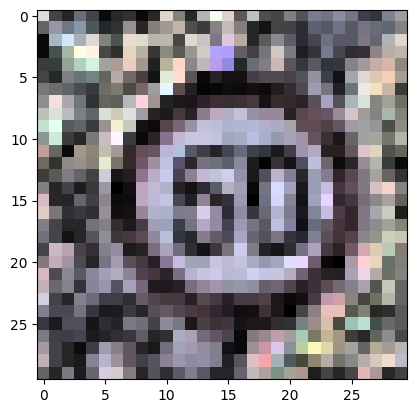

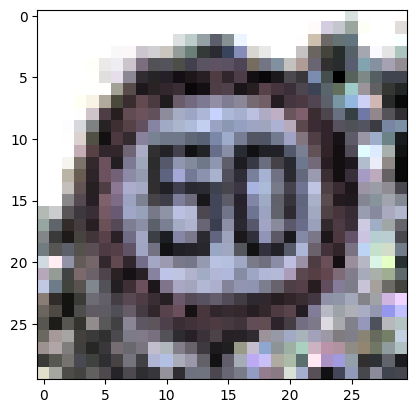

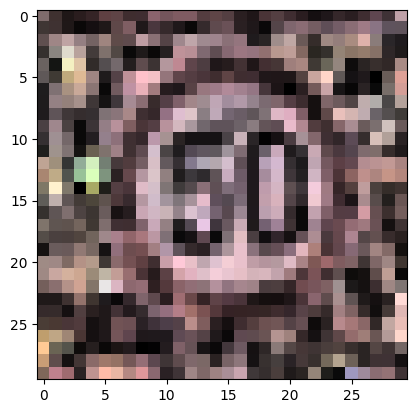

In [27]:
# Ce bloc de code permet de visualiser quelques images du dataset pour en apprécier la qualité et la diversité.
# C'est une étape importante pour comprendre les données avant l'apprentissage.

# Nous allons afficher les images de l'index 300 à 309 (soit 10 images) à titre d'exemple.
# Vous pouvez modifier cette plage pour visualiser d'autres parties du dataset.
for j in  range(300,309):
  # Crée une nouvelle figure pour chaque image, afin qu'elles ne se superposent pas.
  plt.figure()
  # Affiche l'image. 'data' contient les tableaux NumPy des images,
  # et la notation [j,:,:,:] sélectionne la j-ième image avec tous ses pixels et canaux de couleur.
  plt.imshow(data[j,:,:,:])
  # Optionnel: Vous pouvez ajouter un titre à chaque image pour afficher son label
  # par exemple: plt.title(f"Label: {labels[j]}") si la variable 'labels' est définie.

# Question à se poser :
# - Quelle est la qualité visuelle des images ? Sont-elles claires, floues, ou bruitées ?
# - Les objets (panneaux) sont-ils toujours centrés ou de taille constante ?
# - Comment cela pourrait-il affecter la performance de notre modèle de classification ?

1.   Quelle est la qualité d'images ?

La qualité des images est assez mauvaise, on peut voir que les images des panneaux sont très pixelisées, certaines sont plus floues et bruitées que d’autres. De plus, selon les images, la luminosité est également plus ou moins faible.

2.   Les panneaux, ont-il toujours la même position, la même forme ?

Les panneaux ont globalement la même position : à l’endroit, mais ils peuvent être plus ou moins proches, donc de taille plus ou moins grande et pas toujours centrées. Les panneaux n’ont pas la même forme puisqu’il y a des panneaux ronds et triangulaires.


3.   Quelles conséquences pour apprentissage ?

La faible qualité des images rend la tâche de reconnaissance plus difficile et peut entraîner une baisse de la précision. Les variations de taille et de position des panneaux obligent le modèle à être robuste aux transformations spatiales. Le fait que les panneaux n'aient pas toujours la même forme peut parfois aider à la distinction entre les différentes classes, ou au contraire être inconvénient.


---



2.3. Etape suivante : préparer les ensembles de données bien formatées pour l'apprentissage -> vérifions les dimensions, l'encodage des classes (one-hot) et puis coupons le dataset en partie : training et validation

- imprimer les dimensions du vecteur data et shape
- séparer les données dans le train et validation
- imprimer les dimensions des veucteurs X_train, y_train, X_val, y_val
- convertir y_train, y_val dans encodage one-hot



In [67]:
# Affichage des dimensions des données et des labels avant toute modification
print("Forme des données (avant division) :", data.shape)
print("Taille totale des données (nombre d'éléments) :", data.size)
print("Forme des labels (avant division) :", labels.shape)

# Normalisation des données d'image pour les ramener dans la plage [0, 1].
# C'est une étape cruciale pour l'entraînement des réseaux de neurones.
X = data / 255.0

# Division du dataset en ensembles d'entraînement et de validation.
# test_size=0.2 signifie que 20% des données seront utilisées pour la validation.
# random_state=42 assure que la division est reproductible.
# utilisez la fonction train_test_split
X_train, X_val, y_train, y_val = train_test_split(data, labels, test_size=0.2, random_state=42)

# Affichage des dimensions des ensembles après la division pour vérification
print("\n--- Après la division ---")
print("Forme de X_train :", X_train.shape)
print("Forme de y_train :", y_train.shape)
print("Forme de X_val :", X_val.shape)
print("Forme de y_val :", y_val.shape)

# Conversion des labels y_train et y_val en encodage 'one-hot'.
# Cela est nécessaire pour la classification multi-classe avec des fonctions de perte comme 'categorical_crossentropy'.
# num_classes est le nombre total de classes (par exemple, 43 panneaux).
y_train_one_hot = to_categorical(y_train, num_classes=classes)
y_val_one_hot = to_categorical(y_val, num_classes=classes)

# Affichage des dimensions des labels après l'encodage 'one-hot'
print("\n--- Après l'encodage one-hot ---")
print("Forme de y_train (one-hot) :", y_train_one_hot.shape)
print("Forme de y_val (one-hot) :", y_val_one_hot.shape)


Forme des données (avant division) : (21355, 30, 30, 3)
Taille totale des données (nombre d'éléments) : 57658500
Forme des labels (avant division) : (21355,)

--- Après la division ---
Forme de X_train : (17084, 30, 30, 3)
Forme de y_train : (17084,)
Forme de X_val : (4271, 30, 30, 3)
Forme de y_val : (4271,)

--- Après l'encodage one-hot ---
Forme de y_train (one-hot) : (17084, 43)
Forme de y_val (one-hot) : (4271, 43)


# 👆 Etape 3

3.1. On est prêt, on peut construire notre premier modèle du réseau de neurons artificiels. On va commencer par combiner les couches pleinement connectées (on n'a pas travaillé d'autres en classes)

Vous devez testez au minim trois versions (et les comparer dans le rapport)
- V1 : 2 couches pleinement connectées - taille de votre choix (sauf la dernière). Celle qui représente la dernière couche de classification est déjà écrite; complétez en utilisant

*model.add(Dense(..., activation='relu'))*

- V2 : 3 couches au minimum pleinement connectées - taille de votre choix (sauf la dernière)

- V3 : testez avec 2 couches pleinement connectées précdées par au moins une couche convolutive (placée devant couche flatten).

*model.add(Conv2D(filters=.., kernel_size=(..,..), activation='relu'))*

*model.add(MaxPool2D(pool_size=(.., ..)))*

- V4 (optionnelle) vous pouvez multiplier les couches (soyez raisonables)

- vous devez aussi tester la couche Dropout pour une des architectures de votre choix (justifiez le choix et les résultats)

Vous pouvez aussi tester la couche dropout si vous le souhaitez : model.add(Dropout(rate=0.5))

#Modèle de base

In [ ]:
# Building the model
# Utilisez les fonctions de Keras pour construire votre modèle.
# Voici une description des couches que vous pourriez utiliser :

# 1. Couche d'entrée (Input Layer) : Définit la forme des données d'entrée du modèle.
#    Exemple: `model.add(Input(shape=(30, 30, 3)))` si vos images sont 30x30 pixels avec 3 canaux de couleur.

# 2. Couche de Convolution (Conv2D) : Applique des filtres convolutifs pour extraire des caractéristiques des images.
#    `filters`: Nombre de filtres de convolution.
#    `kernel_size`: Dimensions du masque de convolution (ex: (3, 3)).
#    `activation`: Fonction d'activation (généralement 'relu').
#    Exemple: `model.add(Conv2D(filters=32, kernel_size=(5,5), activation='relu'))`

# 3. Couche de Pooling (MaxPool2D) : Réduit la dimension spatiale de l'image, ce qui aide à réduire la complexité computationnelle et le surapprentissage.
#    `pool_size`: Dimensions de la fenêtre de pooling (ex: (2, 2)).
#    Exemple: `model.add(MaxPool2D(pool_size=(2, 2)))`

# 4. Couche Flatten : Convertit les données d'entrée (par exemple, la sortie d'une couche convolutive ou de pooling) en un vecteur unidimensionnel.
#    C'est une étape nécessaire avant de passer les données à des couches pleinement connectées (Dense).
#    Exemple: `model.add(Flatten())`

# 5. Couche Dense (Fully Connected Layer) : Chaque neurone de cette couche est connecté à tous les neurones de la couche précédente.
#    `units`: Nombre de neurones dans la couche.
#    `activation`: Fonction d'activation (ex: 'relu' pour les couches cachées, 'softmax' pour la couche de sortie pour la classification multi-classe).
#    Exemple: `model.add(Dense(units=128, activation='relu'))`

# 6. Couche Dropout : Aide à prévenir le surapprentissage en désactivant aléatoirement un pourcentage de neurones pendant l'entraînement.
#    `rate`: Le pourcentage de neurones à désactiver (ex: 0.2 pour 20%).
#    Exemple: `model.add(Dropout(rate=0.2))`

# --- Votre code pour construire le modèle ici ---
# N'oubliez pas d'initialiser votre modèle comme ceci: `model = Sequential()`
#...insert your code here..
#=============================================
model_de_base = Sequential()
model_de_base.add(keras.Input(shape=X_train.shape[1:]))
model_de_base.add(Flatten())
model_de_base.add(Dense(512, activation='relu'))
model_de_base.add(Dense(classes, activation='softmax'))

# Compilation of the model
optimizer_base = keras.optimizers.Adam(learning_rate=0.0001)

model_de_base.compile(loss='categorical_crossentropy', optimizer=optimizer_base, metrics=['accuracy'])

#Model display
print("===== MODEL DE BASE =====")
model_de_base.summary()


#Modèle 1

In [59]:
model1 = Sequential()
model1.add(keras.Input(shape=X_train.shape[1:]))
model1.add(Flatten())
model1.add(Dense(512, activation='relu'))
model1.add(Dense(256, activation='relu'))
model1.add(Dense(classes, activation='softmax'))

optimizer1 = keras.optimizers.Adam(learning_rate=0.0001)

model1.compile(loss='categorical_crossentropy', optimizer=optimizer1, metrics=['accuracy'])

print("\n===== MODEL1 =====")
model1.summary()



===== MODEL1 =====


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_8 (Flatten)             │ (None, 2700)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 512)            │     1,382,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 43)             │        11,051 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,525,291 (5.82 MB)

 Trainable params: 1,525,291 (5.82 MB)

 Non-trainable params: 0 (0.00 B)

#Modèle 2

In [45]:
model2 = Sequential()
model2.add(keras.Input(shape=X_train.shape[1:]))
model2.add(Flatten())
model2.add(Dense(512, activation='relu'))
model2.add(Dense(256, activation='relu'))
model2.add(Dense(128, activation='relu'))
model2.add(Dense(classes, activation='softmax'))

optimizer2 = keras.optimizers.Adam(learning_rate=0.0001)

model2.compile(loss='categorical_crossentropy', optimizer=optimizer2, metrics=['accuracy'])

print("\n===== MODEL2 =====")
model2.summary()


===== MODEL2 =====


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_5 (Flatten)             │ (None, 2700)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 512)            │     1,382,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 43)             │         5,547 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,552,683 (5.92 MB)

 Trainable params: 1,552,683 (5.92 MB)

 Non-trainable params: 0 (0.00 B)

#Modèle 3


In [46]:
model3 = Sequential()
model3.add(keras.Input(shape=X_train.shape[1:]))
model3.add(Conv2D(filters=32, kernel_size=(3,3), activation='relu')) # Convolution
model3.add(MaxPool2D(pool_size=(2,2))) # Pooling
model3.add(Flatten()) # On aplatie
model3.add(Dense(128, activation='relu'))
model3.add(Dense(64, activation='relu'))
model3.add(Dense(classes, activation='softmax'))

optimizer3 = keras.optimizers.Adam(learning_rate=0.0001)

model3.compile(loss='categorical_crossentropy', optimizer=optimizer3, metrics=['accuracy'])

print("\n===== MODEL3 =====")
model3.summary()


===== MODEL3 =====


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 128)            │       802,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 43)             │         2,795 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 814,891 (3.11 MB)

 Trainable params: 814,891 (3.11 MB)

 Non-trainable params: 0 (0.00 B)

#Modèle 4

In [47]:
model4 = Sequential()
model4.add(keras.Input(shape=X_train.shape[1:]))

model4.add(Conv2D(filters=32, kernel_size=(3,3), activation='relu'))
model4.add(MaxPool2D(pool_size=(2,2)))
model4.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
model4.add(MaxPool2D(pool_size=(2,2)))
model4.add(Flatten())
model4.add(Dense(512, activation='relu'))
model4.add(Dropout(0.3))
model4.add(Dense(256, activation='relu'))
model4.add(Dense(classes, activation='softmax'))

optimizer4 = keras.optimizers.Adam(learning_rate=0.0001)

model4.compile(loss='categorical_crossentropy', optimizer=optimizer4, metrics=['accuracy'])

print("\n===== MODEL4 =====")
model4.summary()



===== MODEL4 =====


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 28, 28, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 12, 12, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 512)            │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 43)             │        11,051 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,341,931 (5.12 MB)

 Trainable params: 1,341,931 (5.12 MB)

 Non-trainable params: 0 (0.00 B)

# 👆 Etape 4. Entrainez le réseaux et évaluez les performances

!rm -rf ./logs/

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

les commandes ci-dessus permettent d'ingrérer un outils de suivi des perfromances d'apprentissage



In [68]:
# Clear any logs from previous runs
!rm -rf ./logs/

#log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
#tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [69]:
# --- ENTRAÎNEMENT MODÈLE 1 ---
#!rm -rf ./logs/fit/Modele1_*

log_dir1 = "logs/fit/Modele1_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback1 = tf.keras.callbacks.TensorBoard(log_dir=log_dir1, histogram_freq=1)

model1.fit(x=X_train,
          y=y_train_one_hot,
          epochs=20,
          validation_data=(X_val, y_val_one_hot),
          callbacks=[tensorboard_callback1])

print("model1")
print(model1.evaluate(X_val, y_val_one_hot))

Epoch 1/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - accuracy: 0.3754 - loss: 3.0831 - val_accuracy: 0.4495 - val_loss: 2.5802
Epoch 2/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 10s 19ms/step - accuracy: 0.5780 - loss: 2.0699 - val_accuracy: 0.6539 - val_loss: 1.6507
Epoch 3/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 20s 19ms/step - accuracy: 0.7024 - loss: 1.3841 - val_accuracy: 0.7476 - val_loss: 1.1763
Epoch 4/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 9s 17ms/step - accuracy: 0.7693 - loss: 1.0168 - val_accuracy: 0.7989 - val_loss: 0.9101
Epoch 5/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 10s 19ms/step - accuracy: 0.8188 - loss: 0.7944 - val_accuracy: 0.8317 - val_loss: 0.7326
Epoch 6/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - accuracy: 0.8554 - loss: 0.6410 - val_accuracy: 0.8703 - val_loss: 0.5966
Epoch 7/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 20s 19ms/step - accuracy: 0.8856 - loss: 0.5293 - val_accuracy: 0.8815 - val_loss: 0.5205
Epoch 8/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 9s 16ms/step - accuracy: 0.9005 - loss: 0.4467 - va

In [70]:
# --- ENTRAÎNEMENT MODÈLE 2 ---
#!rm -rf ./logs/fit/Modele2_*

log_dir2 = "logs/fit/Modele2_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback2 = tf.keras.callbacks.TensorBoard(log_dir=log_dir2, histogram_freq=1)

model2.fit(x=X_train,
          y=y_train_one_hot,
          epochs=20,
          validation_data=(X_val, y_val_one_hot),
          callbacks=[tensorboard_callback2])

print("model2")
print(model2.evaluate(X_val, y_val_one_hot))

Epoch 1/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - accuracy: 0.3439 - loss: 2.8283 - val_accuracy: 0.5907 - val_loss: 1.8379
Epoch 2/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - accuracy: 0.6758 - loss: 1.3575 - val_accuracy: 0.7396 - val_loss: 1.0702
Epoch 3/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - accuracy: 0.7765 - loss: 0.9005 - val_accuracy: 0.8071 - val_loss: 0.7761
Epoch 4/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - accuracy: 0.8282 - loss: 0.6840 - val_accuracy: 0.8424 - val_loss: 0.6244
Epoch 5/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 20s 20ms/step - accuracy: 0.8626 - loss: 0.5511 - val_accuracy: 0.8710 - val_loss: 0.5113
Epoch 6/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 10s 19ms/step - accuracy: 0.8904 - loss: 0.4524 - val_accuracy: 0.8904 - val_loss: 0.4530
Epoch 7/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - accuracy: 0.9067 - loss: 0.3856 - val_accuracy: 0.8932 - val_loss: 0.4152
Epoch 8/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - accuracy: 0.9179 - loss: 0.3342 - 

In [71]:
# --- ENTRAÎNEMENT MODÈLE 3 ---
#!rm -rf ./logs/fit/Modele3_*

log_dir3 = "logs/fit/Modele3_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback3 = tf.keras.callbacks.TensorBoard(log_dir=log_dir3, histogram_freq=1)

model3.fit(x=X_train,
          y=y_train_one_hot,
          epochs=20,
          validation_data=(X_val, y_val_one_hot),
          callbacks=[tensorboard_callback3])

print("model3")
print(model3.evaluate(X_val, y_val_one_hot))

Epoch 1/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - accuracy: 0.4312 - loss: 2.6005 - val_accuracy: 0.6158 - val_loss: 1.9158
Epoch 2/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - accuracy: 0.6967 - loss: 1.4767 - val_accuracy: 0.7879 - val_loss: 1.1071
Epoch 3/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - accuracy: 0.8174 - loss: 0.8877 - val_accuracy: 0.8523 - val_loss: 0.7191
Epoch 4/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - accuracy: 0.8729 - loss: 0.6007 - val_accuracy: 0.8832 - val_loss: 0.5401
Epoch 5/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - accuracy: 0.9072 - loss: 0.4414 - val_accuracy: 0.9087 - val_loss: 0.4146
Epoch 6/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - accuracy: 0.9271 - loss: 0.3449 - val_accuracy: 0.9314 - val_loss: 0.3277
Epoch 7/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - accuracy: 0.9431 - loss: 0.2707 - val_accuracy: 0.9377 - val_loss: 0.2780
Epoch 8/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - accuracy: 0.9538 - loss: 0.2247 - 

In [72]:
# --- ENTRAÎNEMENT MODÈLE 4 ---
#!rm -rf ./logs/fit/Modele4_*

log_dir4 = "logs/fit/Modele4_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback4 = tf.keras.callbacks.TensorBoard(log_dir=log_dir4, histogram_freq=1)

model4.fit(x=X_train,
          y=y_train_one_hot,
          epochs=20,
          validation_data=(X_val, y_val_one_hot),
          callbacks=[tensorboard_callback4])

print("model4")
print(model4.evaluate(X_val, y_val_one_hot))

Epoch 1/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - accuracy: 0.6616 - loss: 1.7913 - val_accuracy: 0.8888 - val_loss: 0.6834
Epoch 2/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 42s 42ms/step - accuracy: 0.8825 - loss: 0.5165 - val_accuracy: 0.9424 - val_loss: 0.2760
Epoch 3/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 22s 42ms/step - accuracy: 0.9322 - loss: 0.2731 - val_accuracy: 0.9597 - val_loss: 0.1728
Epoch 4/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 41s 42ms/step - accuracy: 0.9581 - loss: 0.1729 - val_accuracy: 0.9710 - val_loss: 0.1228
Epoch 5/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 22s 42ms/step - accuracy: 0.9720 - loss: 0.1217 - val_accuracy: 0.9745 - val_loss: 0.1082
Epoch 6/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step - accuracy: 0.9765 - loss: 0.0930 - val_accuracy: 0.9820 - val_loss: 0.0788
Epoch 7/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 42s 42ms/step - accuracy: 0.9837 - loss: 0.0686 - val_accuracy: 0.9850 - val_loss: 0.0668
Epoch 8/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 22s 42ms/step - accuracy: 0.9891 - loss: 0.0501 - 

In [73]:

%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 45128), started 2:37:22 ago. (Use '!kill 45128' to kill it.)

<IPython.core.display.Javascript object>

On peut générer la matrice de confusion des modèles pour mieux se rendre compte de la précision du modèle et de ses zones de confusion.

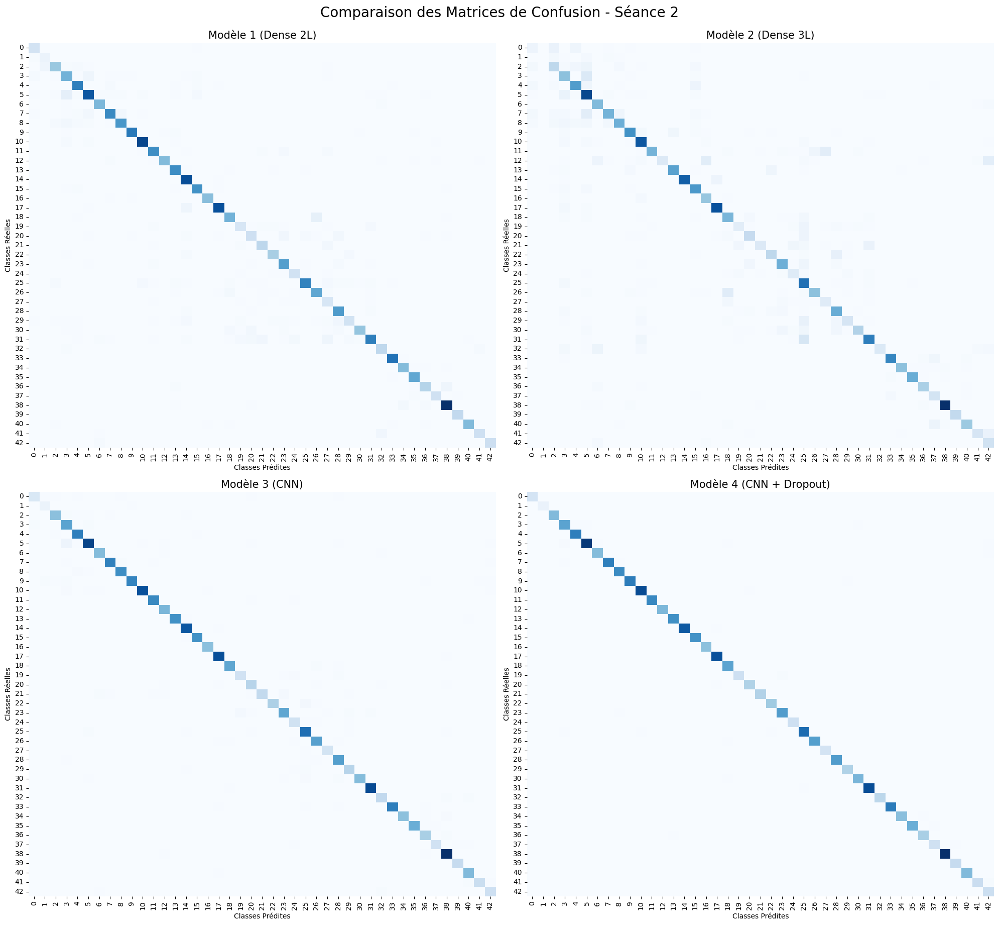

In [62]:
# 1. Préparation des données
models = [model1, model2, model3, model4]
model_names = ["Modèle 1 (Dense 2L)", "Modèle 2 (Dense 3L)",
               "Modèle 3 (CNN)", "Modèle 4 (CNN + Dropout)"]
y_true = np.argmax(y_val_one_hot, axis=1)

# 2. Création de la figure 2x2
fig, axes = plt.subplots(2, 2, figsize=(20, 18))
axes = axes.ravel() # Aplatir la grille pour itérer facilement

for i, model in enumerate(models):
    # Prédiction
    y_pred_probs = model.predict(X_val, verbose=0)
    y_pred_classes = np.argmax(y_pred_probs, axis=1)

    # Calcul de la matrice
    cm = confusion_matrix(y_true, y_pred_classes)

    # Affichage sur la sous-figure correspondante
    sns.heatmap(cm, annot=False, fmt='d', cmap='Blues', ax=axes[i], cbar=False)
    axes[i].set_title(model_names[i], fontsize=15)
    axes[i].set_xlabel('Classes Prédites')
    axes[i].set_ylabel('Classes Réelles')

plt.tight_layout()
plt.suptitle("Comparaison des Matrices de Confusion - Séance 2", fontsize=20, y=1.02)
plt.show()

Pour les Modèles 1 et 2, on remarque un "bruit" important autour de la diagonale principale. De nombreux points bleus clairs apparaissent hors de la diagonale, ce qui indique des confusions fréquentes entre différentes classes de panneaux. Ces architectures denses peinent à capturer les caractéristiques spatiales complexes des images, même après égalisation.

Pour les Modèle 3 et 4, la diagonale devient beaucoup plus nette et marquée. L’introduction des couches de convolution permet au modèle de mieux distinguer les formes géométriques. La réduction drastique des points hors-diagonale montre que les erreurs grossières diminuent fortement.


Pour visualiser avec plus de précision, on peut générer la matrice de confusion avec les scores chiffrés pour le modèle de notre choix.

134/134 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
Matrice de confusion pour Model 4:


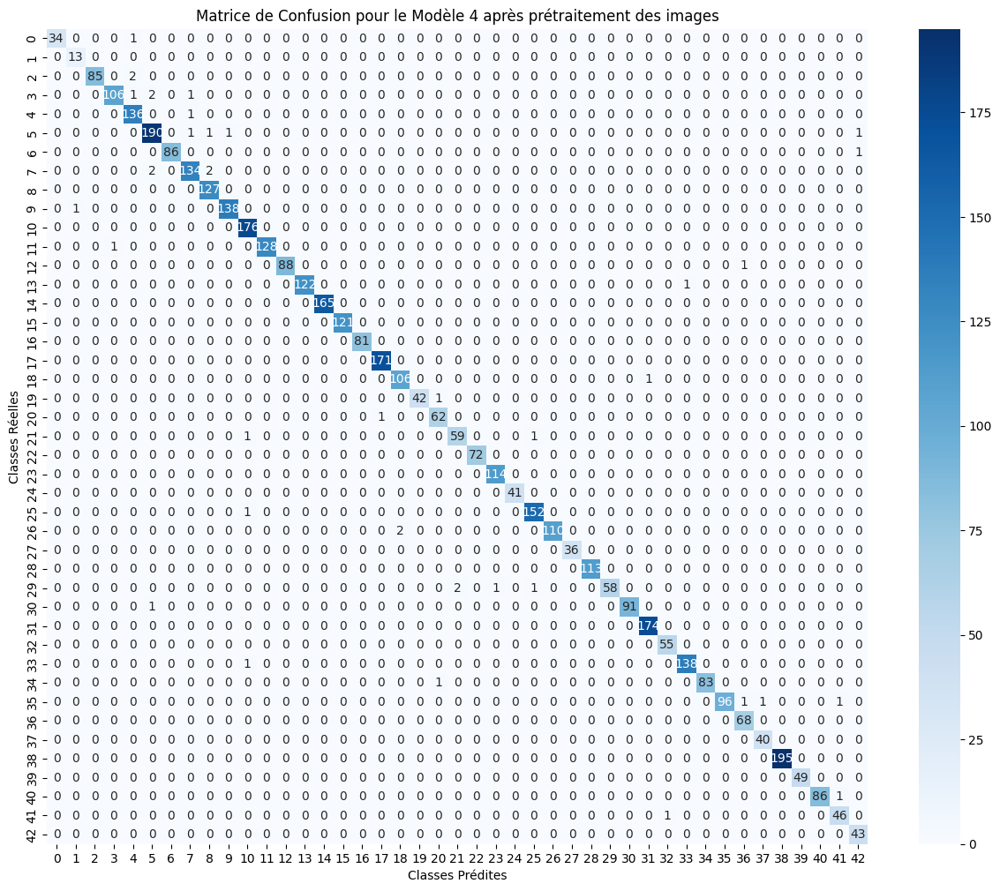

In [19]:
import seaborn as sns

# Make predictions on the validation set using model4
y_pred_model = model4.predict(X_val)

# Convert predictions from one-hot encoding to class labels
y_pred_classes_model = np.argmax(y_pred_model, axis=1)

# Convert true labels from one-hot encoding to class labels
y_true_classes_model = np.argmax(y_val_one_hot, axis=1)

# Calculate the confusion matrix for model4
cm_model = confusion_matrix(y_true_classes_model, y_pred_classes_model)

print("Matrice de confusion pour Model 4:")
# Plotting the confusion matrix
plt.figure(figsize=(15, 12))
sns.heatmap(cm_model, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Classes Prédites')
plt.ylabel('Classes Réelles')
plt.title('Matrice de Confusion pour le Modèle 4 après prétraitement des images')
plt.show()

Le Modèle 4 est le plus précis. Les scores de prédictions correctes sur la diagonale sont généralement supérieurs d'un à deux points par rapport à ceux du Modèle 3. L'ajout du Dropout a permis d'affiner les frontières de décision, éliminant certaines confusions résiduelles du Modèle 3.

# 👆 5. Testez ici les images du fichier test.zip et évaluez la qualité de classification



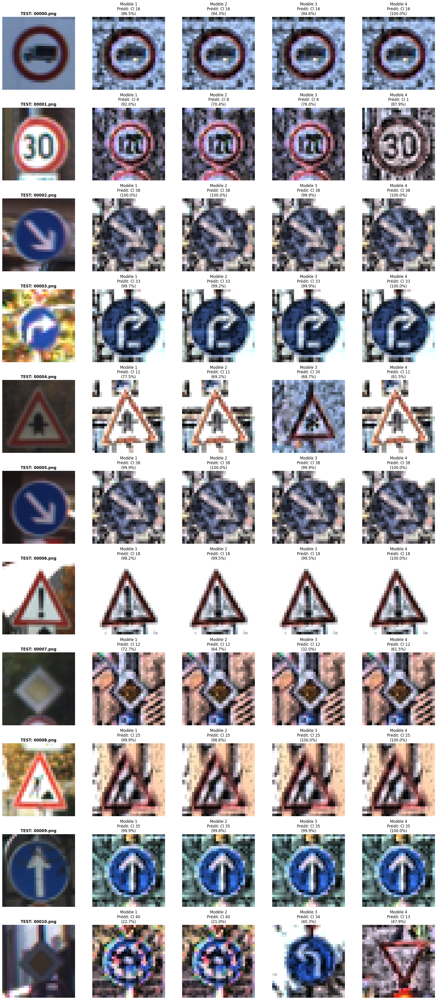

In [74]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# 1. Préparation des données de test
path_test = "/content/drive/Shareddrives/Introduction IA/dataset_test/test"
test_data = []
test_filenames = []

images = sorted(os.listdir(path_test))
for a in images:
    try:
        img = Image.open(os.path.join(path_test, a))
        img = img.resize((30, 30))
        test_data.append(np.array(img))
        test_filenames.append(a)
    except Exception as e:
        print(f"Erreur image {a}: {e}")

test_data = np.array(test_data) / 255.0
models = [model1, model2, model3, model4]
model_names = ["Modèle 1", "Modèle 2", "Modèle 3", "Modèle 4"]

def get_image_ref(class_id):
    try:
        idx = np.where(y_train == class_id)[0][0]
        return X_train[idx]
    except:
        return np.zeros((30, 30, 3))

# 2. Création de la figure comparative (Grille : 5 colonnes)
# Colonne 1 : Image Test | Col 2 : Ref M1 | Col 3 : Ref M2 | Col 4 : Ref M3 | Col 5 : Ref M4
num_images = len(test_data)
fig, axes = plt.subplots(num_images, 5, figsize=(20, 4 * num_images))

for i in range(num_images):
    # --- Colonne 0 : L'image de TEST originale ---
    axes[i, 0].imshow(test_data[i])
    axes[i, 0].set_title(f"TEST: {test_filenames[i]}", fontweight='bold')
    axes[i, 0].axis('off')

    # --- Colonnes 1 à 4 : Prédictions des modèles ---
    for m_idx, model in enumerate(models):
        # Prédiction individuelle pour cette image
        img_input = np.expand_dims(test_data[i], axis=0)
        pred_prob = model.predict(img_input, verbose=0)
        class_id = np.argmax(pred_prob)
        conf = np.max(pred_prob) * 100

        # Affichage de l'image de référence correspondante
        ref_img = get_image_ref(class_id)
        axes[i, m_idx + 1].imshow(ref_img)
        axes[i, m_idx + 1].set_title(f"{model_names[m_idx]}\nPrédit: Cl {class_id}\n({conf:.1f}%)")
        axes[i, m_idx + 1].axis('off')

plt.tight_layout()
plt.show()

ATTENTION - il faut sauvegarder votre model appris pour une uitlisation plus tard ....et pour finir... assurez-vous qu'il est dans le DRIVE et pas dans l'environement d'éxécution qui sera supprimé à la fin de votre session colab.

In [ ]:
#øi vous êtes contents, vous pouvez enregistrer le modèle pour l'utiliser dans une application
# Saving the Model
model4.save('MyRoadSignNetwork.keras')

#Séance 2


##Etape 1


1.   Refaire l’entraînement avec le meilleur modèle et des images améliorées

En premier lieu on refait l’apprentissage après amélioration du contraste des images pour évaluer l’impact du prétraitement sur les performances du réseau :


Le Model 4 étant celui avec le meilleur taux d'accuracy lorsqu'on augmente le nombre d'epoch, on va alors garder la même architecture model4, modifier les images d’entrée et refaire tout l’entraînement.
Pour cela on normalise d'abord les images :


In [ ]:
from skimage import exposure

data_eq = []

for img in data:
   img_float = img / 255.0
   img_eq = exposure.equalize_adapthist(img_float, clip_limit=0.03)
   data_eq.append(img_eq)

data_eq = np.array(data_eq, dtype=np.float32)

X_train_eq, X_val_eq, y_train_eq, y_val_eq = train_test_split(
   data_eq, labels, test_size=0.2, random_state=42, stratify=labels
)

y_train_eq_one_hot = to_categorical(y_train_eq, num_classes=classes)
y_val_eq_one_hot = to_categorical(y_val_eq, num_classes=classes)


Maintenant on reconstruit model4, on le recompile, réentraîne et évalue


In [ ]:
log_dir = "logs/fit/Model4_" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback4 = tf.keras.callbacks.TensorBoard(log_dir=log_dir4, histogram_freq=1)

model4.fit(x=X_train_eq,
         y=y_train_eq_one_hot,
         epochs=20,
         validation_data=(X_val_eq, y_val_eq_one_hot),
         callbacks=[tensorboard_callback4])

score_eq = model4.evaluate(X_val_eq, y_val_eq_one_hot, verbose=0)
print("Modèle 4 avec égalisation - Loss :", score_eq[0], " Accuracy :", score_eq[1])

In [ ]:
%tensorboard --logdir logs/fit

On peut visualiser l'amélioration du modèle en générant de nouveau sa matrice de confusion.

In [ ]:
# Make predictions on the validation set using model4
y_pred_model_eq = model4.predict(X_val_eq)

# Convert predictions from one-hot encoding to class labels
y_pred_classes_model_eq = np.argmax(y_pred_model_eq, axis=1)

# Convert true labels from one-hot encoding to class labels
y_true_classes_model_eq = np.argmax(y_val_eq_one_hot, axis=1)

# Calculate the confusion matrix for model4
cm_model_eq = confusion_matrix(y_true_classes_model_eq, y_pred_classes_model_eq)

print("Matrice de confusion pour Model 4:")
# Plotting the confusion matrix
plt.figure(figsize=(15, 12))
sns.heatmap(cm_model_eq, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Classes Prédites')
plt.ylabel('Classes Réelles')
plt.title('Matrice de Confusion pour après exposure.equalize_adapthist')
plt.show()

L'analyse comparative des matrices de confusion confirme que le prétraitement des données a permis de réduire des erreurs de classification. Ces résultats démontrent que l'égalisation des images a permis de clarifier les frontières de décision du modèle, facilitant la distinction entre des panneaux aux caractéristiques morphologiques similaires.

On peut de nouveau effectuer le test de qualité avec le dataset d'imges de test pour voir les différences.

Nombre d'images : 11
Shape test_data : (11, 30, 30, 3)
Shape test_labels : (11,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


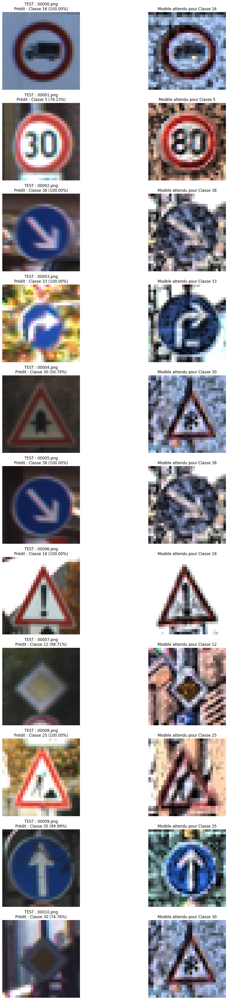

In [40]:
# 1. Extraire le dataset de test
test_file_zip = "/content/drive/Shareddrives/Introduction IA/test.zip"

# !unzip file_to_decompress -d folder_to_decompress_data_into
# !unzip "/content/drive/Shareddrives/Introduction IA/test.zip" -d  "/content/drive/Shareddrives/Introduction IA/dataset_test/"

path_test = "/content/drive/Shareddrives/Introduction IA/dataset_test/test"

# 2. Préparer les données de test
test_data = []
test_labels = []

# Parcours des dossiers de test
images = sorted(os.listdir(path_test))
print(f'Nombre d\'images : {len(images)}')

for a in images:
    try:
        # Charger l'image
        img = Image.open(os.path.join(path_test, a))
        # Redimensionner
        img = img.resize((30, 30))
        # Convertir en numpy array
        img = np.array(img)
        # Ajouter aux listes
        test_data.append(img)
        test_labels.append(a)

    except Exception as e:
        print(f"Erreur image {a}: {e}")

# Conversion en numpy
test_data = np.array(test_data) / 255.0
test_labels = np.array(test_labels)

print("Shape test_data :", test_data.shape)
print("Shape test_labels :", test_labels.shape)

# Prédictions
results = model4.predict(test_data)

# Classe prédite
yhat = np.argmax(results, axis=1)

# Confiance
confidence = np.max(results, axis=1)

# On affiche les images de test à côté de leur classe de référence prédite
plt.figure(figsize=(16, 4 * len(test_data)))

for i in range(len(test_data)):
    # Image de TEST
    plt.subplot(len(test_data), 2, 2*i + 1)
    plt.imshow(test_data[i])
    conf_percent = confidence[i] * 100
    plt.title(f"TEST : {test_labels[i]}\nPrédit : Classe {yhat[i]} ({conf_percent:.2f}%)")
    plt.axis('off')

    # Image de REF
    plt.subplot(len(test_data), 2, 2*i + 2)
    ref_img = get_image_ref(yhat[i])
    plt.imshow(ref_img)
    plt.title(f"Modèle attendu pour Classe {yhat[i]}")
    plt.axis('off')

plt.tight_layout()
plt.show()


##Etape 2

À présent, nous voulons encore améliorer le modèle en cherchant ses failles pour les corriger. Pour deux classes de panneaux distinctes, il s'agit de trouver dans le dataset des images pour lesquelles notre meilleure architecture échoue.

L'analyse de la matrice de confusion (voir Figure 17) révèle que le modèle confond ponctuellement le panneau "60 km/h" (Classe 3) avec le panneau "80 km/h" (Classe 5).

Nous avons créer un dataset contenant certaines images des classes 3 et 5 avec des conditions extrêmes de luminosité pour tester le modèle.

Nombre d'images : 8
Shape classe_3_5_data : (8, 30, 30, 3)
Shape classe_3_5_labels : (8,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


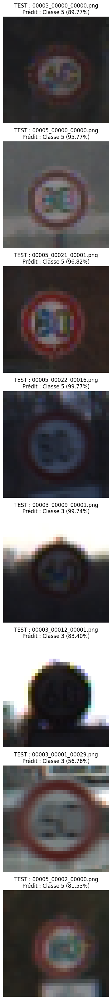

In [37]:
path_classe_3_5 = "/content/drive/Shareddrives/Introduction IA/dataset_classe_3_5"


# 2. Préparer les données de test
classe_3_5_data = []
classe_3_5_labels = []

# Parcours des dossiers de test
images = os.listdir(path_classe_3_5)
print(f'Nombre d\'images : {len(images)}')

for a in images:
    try:
        # Charger l'image
        img = Image.open(os.path.join(path_classe_3_5, a))
        # Redimensionner
        img = img.resize((30, 30))
        # Convertir en numpy array
        img = np.array(img)
        # Ajouter aux listes
        classe_3_5_data.append(img)
        classe_3_5_labels.append(a)

    except Exception as e:
        print(f"Erreur image {a}: {e}")

# Conversion en numpy
classe_3_5_data = np.array(classe_3_5_data) / 255.0
classe_3_5_labels = np.array(classe_3_5_labels)

print("Shape classe_3_5_data :", classe_3_5_data.shape)
print("Shape classe_3_5_labels :", classe_3_5_labels.shape)

# Prédictions
results = model4.predict(classe_3_5_data)

# Classe prédite
yhat = np.argmax(results, axis=1)

# Confiance
confidence = np.max(results, axis=1)

# On affiche les images de test à côté de leur classe de référence prédite
plt.figure(figsize=(16, 4 * len(classe_3_5_data)))

for i in range(len(classe_3_5_data)):
    # Image de TEST
    plt.subplot(len(classe_3_5_data), 2, 2*i + 1)
    plt.imshow(classe_3_5_data[i])
    conf_percent = confidence[i] * 100
    plt.title(f"TEST : {classe_3_5_labels[i]}\nPrédit : Classe {yhat[i]} ({conf_percent:.2f}%)")
    plt.axis('off')

plt.tight_layout()
plt.show()



##Etape 3



Dans cette étape, nous voulons évaluer les matrices de confusion des quatre modèles pour les ensembles Train et Test.

Génération des matrices pour l'ensemble d'entraînement...


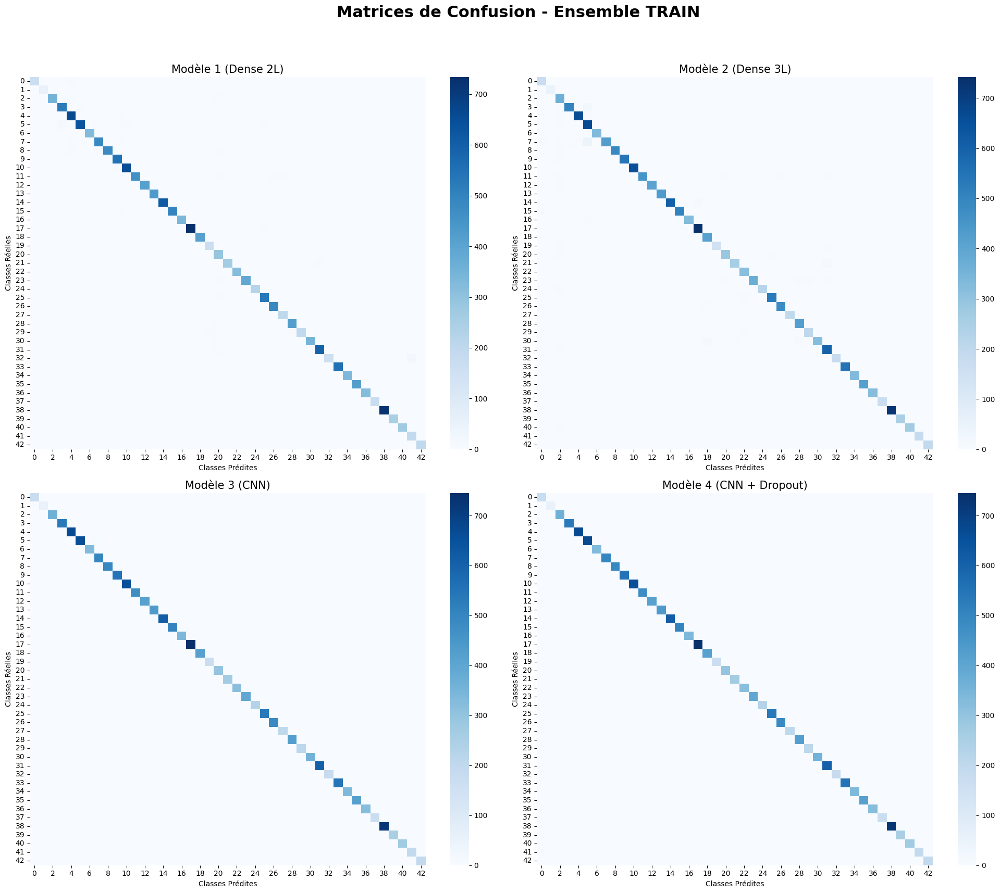

Génération des matrices pour l'ensemble de test...


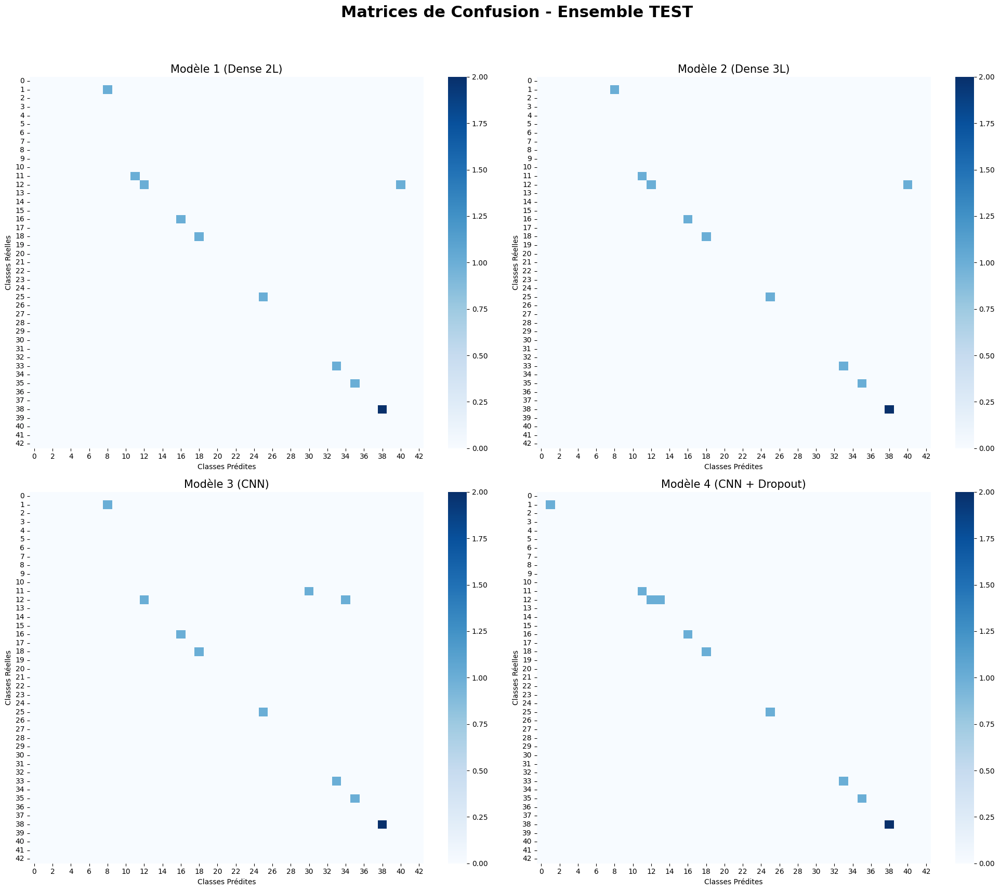

In [75]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Liste de vos modèles et de leurs noms
models = [model1, model2, model3, model4]
model_names = ["Modèle 1 (Dense 2L)", "Modèle 2 (Dense 3L)",
               "Modèle 3 (CNN)", "Modèle 4 (CNN + Dropout)"]

# Définir le nombre total de classes (43 pour votre dataset)
nb_classes = 43

# 1. Préparation des données
y_train_true = np.argmax(y_train, axis=1) if len(y_train.shape) > 1 else y_train

# ATTENTION : Pour le test, on doit utiliser les VRAIS labels (y_test_true)
# des 11 images ([16, 1, 38, 33, 11, 38, 18, 12, 25, 35, 12])
y_test_true = np.array([16, 1, 38, 33, 11, 38, 18, 12, 25, 35, 12])

def plot_all_confusion_matrices(data, labels_true, set_name):
    """Génère une grille 2x2 de matrices de confusion avec un nombre de classes fixe"""
    plt.figure(figsize=(20, 18))
    plt.suptitle(f"Matrices de Confusion - Ensemble {set_name}", fontsize=22, fontweight='bold')

    for i, model in enumerate(models):
        # Prédictions
        preds = model.predict(data, verbose=0)
        y_pred = np.argmax(preds, axis=1)

        # CORRECTIF : On force la taille de la matrice à 43x43 avec le paramètre labels
        cm = confusion_matrix(labels_true, y_pred, labels=range(nb_classes))

        # Affichage
        plt.subplot(2, 2, i + 1)
        sns.heatmap(cm, annot=False, cmap='Blues', cbar=True)
        plt.title(f"{model_names[i]}", fontsize=15)
        plt.xlabel("Classes Prédites")
        plt.ylabel("Classes Réelles")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# 2. Exécution pour le Train
print("Génération des matrices pour l'ensemble d'entraînement...")
plot_all_confusion_matrices(X_train, y_train_true, "TRAIN")

# 3. Exécution pour le Test
print("Génération des matrices pour l'ensemble de test...")
# On utilise y_test_true (les vrais labels) et non yhat (qui sont les prédictions)
plot_all_confusion_matrices(test_data, y_test_true, "TEST")

Aussi, pour une évaluation rigoureuse en classification multi-classes, trois métriques complémentaires ont été calculées en mode macro (moyenne équilibrée sur les 43 classes) via scikit-learn, en plus de l’accuracy globale.
Précision (Precision) : La précision mesure la fiabilité du modèle lorsqu'il affirme avoir trouvé une classe spécifique. (Exemple : « Quand le modèle prédit un panneau "Stop", quelle est la probabilité que ce soit réellement un panneau "Stop" ? »)
Rappel (Recall) : Le rappel mesure la capacité du modèle à identifier toutes les instances réelles d'une classe sans en oublier. (Exemple : « Sur 100 panneaux "Stop" présents sur la route, combien le modèle a-t-il réussi à en détecter ? »)
F1-Score : Le F1-Score est la moyenne harmonique entre la précision et le rappel. Il est essentiel pour valider la performance sur les 43 classes, car il pénalise sévèrement les modèles qui sacrifieraient les classes rares pour obtenir une bonne accuracy globale.

In [65]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Liste de nos modèles pour itération
models = [model1, model2, model3, model4]
model_names = ["Modèle 1 (Dense 2L)", "Modèle 2 (Dense 3L)", "Modèle 3 (CNN)", "Modèle 4 (CNN + Dropout)"]

# On récupère les vraies étiquettes (en supposant que vous utilisez le set de validation égalisé)
y_true = np.argmax(y_val_one_hot, axis=1)

for i, model in enumerate(models):
    print(f"\n" + "="*30)
    print(f" ÉVALUATION : {model_names[i]}")
    print("="*30)

    # 1. Prédictions
    y_pred_probs = model.predict(X_val, verbose=0)
    y_pred_classes = np.argmax(y_pred_probs, axis=1)

    # 2. Rapport de classification (Précision, Rappel, F1)
    # On utilise target_names pour plus de clarté
    print(classification_report(y_true, y_pred_classes, digits=4))

    # 3. Matrice de Confusion (optionnel : affiche les 5 premières lignes pour ne pas encombrer)
    cm = confusion_matrix(y_true, y_pred_classes)
    print(f"Aperçu de la matrice de confusion (5 premières classes) :\n{cm[:5, :5]}")


 ÉVALUATION : Modèle 1 (Dense 2L)
              precision    recall  f1-score   support

           0     0.8095    0.9714    0.8831        35
           1     0.5500    0.8462    0.6667        13
           2     0.8765    0.8161    0.8452        87
           3     0.7063    0.8091    0.7542       110
           4     0.8836    0.9416    0.9117       137
           5     0.8722    0.8093    0.8396       194
           6     0.9130    0.9655    0.9385        87
           7     0.9167    0.8768    0.8963       138
           8     0.9256    0.8819    0.9032       127
           9     0.9779    0.9568    0.9673       139
          10     0.9548    0.9602    0.9575       176
          11     0.9219    0.9147    0.9183       129
          12     0.9880    0.9213    0.9535        89
          13     0.9015    0.9675    0.9333       123
          14     0.8677    0.9939    0.9266       165
          15     0.9274    0.9504    0.9388       121
          16     0.9875    0.9753    0.9814   

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

           0     0.3448    0.2857    0.3125        35
           1     0.0000    0.0000    0.0000        13
           2     0.6118    0.5977    0.6047        87
           3     0.5455    0.7091    0.6166       110
           4     0.8182    0.7883    0.8030       137
           5     0.6357    0.8814    0.7387       194
           6     0.7281    0.9540    0.8259        87
           7     0.8824    0.6522    0.7500       138
           8     0.8532    0.7323    0.7881       127
           9     0.8864    0.8417    0.8635       139
          10     0.8000    0.9091    0.8511       176
          11     0.9677    0.6977    0.8108       129
          12     1.0000    0.2921    0.4522        89
          13     0.9286    0.8455    0.8851       123
          14     1.0000    0.9333    0.9655       165
          15     0.7832    0.9256    0.8485       121
          16     0.7255    0.9136    0.8087        81
          17     0.9371    